<!--
 * @Author: jyyd23@mails.tsinghua.edu.cn
 * @Date: 2024-05-23 17:08:06
 * @LastEditors: jyyd23@mails.tsinghua.edu.cn
 * @LastEditTime: 2024-05-25 00:47:39
 * @FilePath: test_plot.ipynb
 * @Description: 
-->
- pred plot


In [2]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import PM_pop as pop

Stacking_name = 'HR-PM-TS'

hist_plot_data25 = pop.plot_result('./out/csv_file/metrics/pncdata2020_pred_test_pm25_stack.csv',
                               './out/csv_file/metrics/pm25data_2020_pred_DL.csv',
                               './out/csv_file/metrics/resultspm25.csv',
                               Stacking_name=Stacking_name)
hist_plot_data10 = pop.plot_result('./out/csv_file/metrics/pncdata2020_pred_test_pm10_stack.csv',
                               './out/csv_file/metrics/pm10data_2020_pred_DL.csv',
                               './out/csv_file/metrics/resultspm10.csv',
                               Stacking_name=Stacking_name)
hist_plot_data10[['mse', 'mae', 'evs', 'r2', 'RMSE', 'bias']] = hist_plot_data10[['mse', 'mae', 'evs', 'r2', 'RMSE', 'bias']].apply(lambda x: round(x, 2))
hist_plot_data25[['mse', 'mae', 'evs', 'r2', 'RMSE', 'bias']] = hist_plot_data25[['mse', 'mae', 'evs', 'r2', 'RMSE', 'bias']].apply(lambda x: round(x, 2))
hist_plot_data10, hist_plot_data25

(      mse   mae    r2   evs              model  RMSE  bias
 0   16.48  1.99  0.82  0.83             Linear  4.06 -0.52
 1   16.51  1.95  0.82  0.83              Lasso  4.06 -0.51
 2   21.76  2.51  0.77  0.77                KNN  4.66 -0.49
 3   24.57  2.63  0.74  0.74       Decsion Tree  4.96 -0.36
 4   17.37  2.10  0.82  0.82      Random Forest  4.17 -0.38
 5   21.28  2.65  0.77  0.77           AdaBoost  4.61 -0.28
 6   14.17  1.72  0.85  0.85  Gradient Boosting  3.76 -0.43
 7   14.35  1.73  0.85  0.85           LightGBM  3.79 -0.47
 8   13.92  1.70  0.85  0.86           HR-PM-TS  3.73 -0.57
 9   14.43  1.81  0.85  0.85                RNN  3.80  3.96
 10  14.86  1.86  0.84  0.84                CNN  3.86  3.93
 11  15.36  1.89  0.84  0.84               LSTM  3.92  3.70,
       mse   mae    r2   evs              model  RMSE  bias
 0    8.83  1.63  0.80  0.81             Linear  2.97  0.61
 1    8.77  1.63  0.80  0.81              Lasso  2.96  0.59
 2    7.23  1.74  0.84  0.84           

In [3]:
# cost time
pm25_rnn_time = pd.to_datetime('2024-03-25 18:39:57') - pd.to_datetime('2024-03-25 14:56:58')
pm25_cnn_time = pd.to_datetime('2024-03-25 23:57:23') - pd.to_datetime('2024-03-25 18:39:57')
pm25_lstm_time = pd.to_datetime('2024-03-26 10:03:23') - pd.to_datetime('2024-03-25 23:57:23')
pm10_rnn_time = pd.to_datetime('2024-03-26 21:11:49') - pd.to_datetime('2024-03-26 18:30:10')
pm10_cnn_time = pd.to_datetime('2024-03-27 02:12:12') - pd.to_datetime('2024-03-26 21:11:49')
pm10_lstm_time = pd.to_datetime('2024-03-27 04:15:00') - pd.to_datetime('2024-03-27 02:12:12')
print(pm25_rnn_time.total_seconds()/60, pm25_cnn_time.total_seconds()/60, pm25_lstm_time.total_seconds()/60)
print(pm10_rnn_time.total_seconds()/60, pm10_cnn_time.total_seconds()/60, pm10_lstm_time.total_seconds()/60)

222.98333333333332 317.43333333333334 606.0
161.65 300.3833333333333 122.8


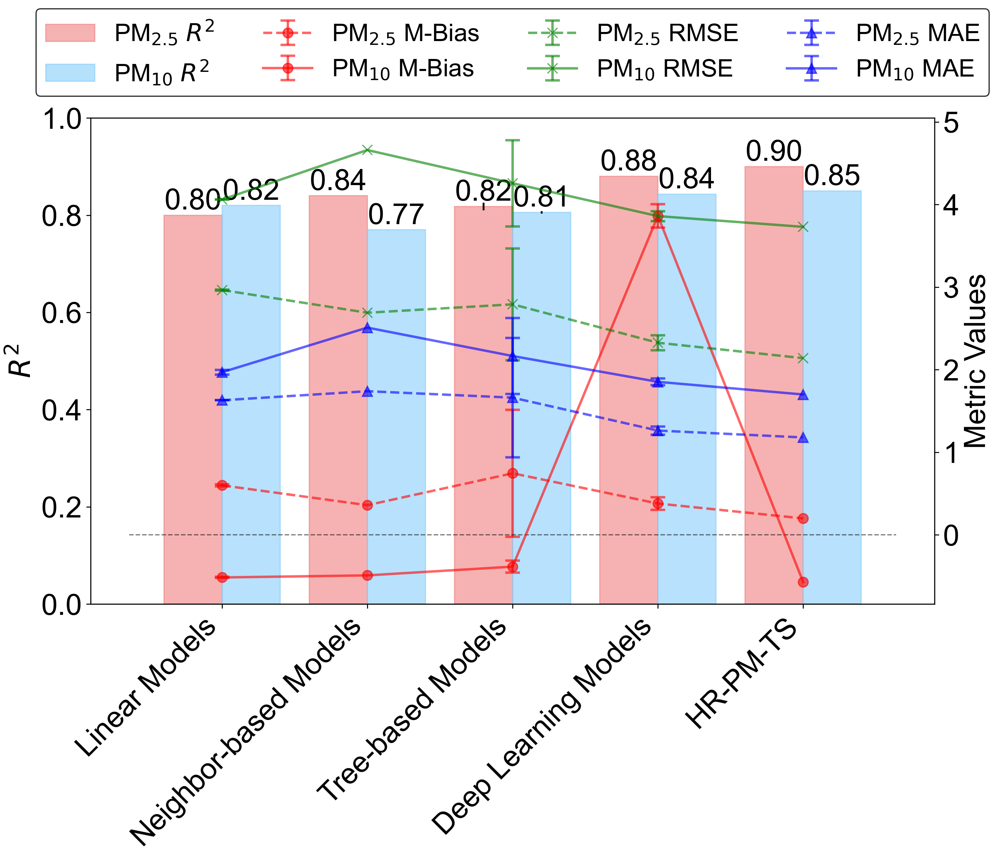

In [40]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 24
fig, ax1 = plt.subplots(dpi=300, figsize=(12, 11))
import PM_pop as pop

model_type_means25, model_type_var25, model_type_std25 = pop.hist_plot(hist_plot_data25, Stacking_name=Stacking_name)
model_type_means10, model_type_var10, model_type_std10 = pop.hist_plot(hist_plot_data10, Stacking_name=Stacking_name)
x = np.arange(len(model_type_means25['model_type']))

# R2 plot
width = 0.4
bars25 = ax1.bar(x - width/2, model_type_means25['r2'], width,
               yerr=model_type_var25['r2'], alpha=0.6, color='lightcoral', 
               label=r'PM$_{2.5}$ $R^2$', edgecolor='lightcoral', linewidth=1)
bars10 = ax1.bar(x + width/2, model_type_means10['r2'], width,
               yerr=model_type_var10['r2'], alpha=0.6, color='lightskyblue', 
               label=r'PM$_{10}$ $R^2$', edgecolor='lightskyblue', linewidth=1)

# Adding data labels for the bars
for bar in bars25:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height, '{:.2f}'.format(height),
             ha='center', va='bottom', color='black')
for bar in bars10:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height, '{:.2f}'.format(height),
             ha='center', va='bottom', color='black')
ax1.set_xticks(x)
ax1.set_xticklabels(model_type_means25['model_type'], rotation=45, ha='right')
ax1.set_ylabel('$R^2$')
ax1.set_ylim(0, 1)

# plot line chart for bias, RMSE, and MAE
ax2 = ax1.twinx()
ax2.errorbar(model_type_means25['model_type'], model_type_means25['bias'], yerr=model_type_std25['bias'],
             fmt='r--', marker='o', linewidth=2, alpha=0.6, markersize=8, capsize=6, capthick=2,
               label=r'PM$_{2.5}$ M-Bias') # Bias plot
ax2.errorbar(model_type_means10['model_type'], model_type_means10['bias'], yerr=model_type_std10['bias'],
             fmt='r-+', marker='o', linewidth=2, alpha=0.6, markersize=8, capsize=6, capthick=2,
               label=r'PM$_{10}$ M-Bias') # Bias plot
ax2.errorbar(model_type_means25['model_type'], model_type_means25['RMSE'], yerr=model_type_std25['RMSE'],
             fmt='g--', marker='x', linewidth=2, alpha=0.6, markersize=8, capsize=6, capthick=2,
               label=r'PM$_{2.5}$ RMSE') # RMSE plot
ax2.errorbar(model_type_means10['model_type'], model_type_means10['RMSE'], yerr=model_type_std10['RMSE'],
             fmt='g-+', marker='x', linewidth=2, alpha=0.6, markersize=8, capsize=6, capthick=2,
               label=r'PM$_{10}$ RMSE') # RMSE plot
ax2.errorbar(model_type_means25['model_type'], model_type_means25['mae'], yerr=model_type_std25['mae'],
             fmt='b--', marker='^', linewidth=2, alpha=0.6, markersize=8, capsize=6, capthick=2,
               label=r'PM$_{2.5}$ MAE') # MAE plot
ax2.errorbar(model_type_means10['model_type'], model_type_means10['mae'], yerr=model_type_std10['mae'],
             fmt='b-+', marker='^', linewidth=2, alpha=0.6, markersize=8, capsize=6, capthick=2,
               label=r'PM$_{10}$ MAE') # MAE plot

xlim = ax2.get_xlim()
x = np.linspace(xlim[0], xlim[1], len(model_type_means25['model_type']))
ax2.plot(x, np.zeros_like(x), 'k--', linewidth=1, alpha=0.5)
ax2.set_ylabel('Metric Values')
ax2.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Combining the legends from both the plots and placing it on top of the figure
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.25), ncol=4,
           edgecolor='black', fontsize=20)

plt.tight_layout()
plt.savefig('./figure/hist_metric.png', dpi=600, bbox_inches='tight')
plt.show()

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 24

def log_plot(pm_file, pollution_type, time_type='Daily', num_text:str='(a)'):
    min_temp, max_temp = 0, 100

    stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
    markers = ['s', 'D', '^', 'o', '>']
    marker_size = 100

    pm_pred2020 = pd.read_csv(pm_file)
    pm_pred2020 = pm_pred2020.drop(['Unnamed: 0'], axis=1)

    if time_type == 'Daily':
        pm_pred2020['date'] = pd.to_datetime(pm_pred2020['Date/time']).dt.date
        pm_pred2020 = pm_pred2020.drop(columns=['Date/time'])
        pm_data_pred = pm_pred2020.groupby([pm_pred2020['date'], 'station']).mean().reset_index()
        pm_num = 2
    elif time_type == 'Hourly':
        pm_pred2020['date'] = pd.to_datetime(pm_pred2020['Date/time'])
        pm_pred2020 = pm_pred2020.drop(columns=['Date/time'])
        pm_data_pred = pm_pred2020
        pm_num = 1
    elif time_type == 'Weekly':
        pm_pred2020['date'] = pd.to_datetime(pm_pred2020['Date/time']).dt.to_period('W')
        pm_pred2020 = pm_pred2020.drop(columns=['Date/time'])
        pm_data_pred = pm_pred2020.groupby([pm_pred2020['date'], 'station']).mean().reset_index()
        pm_num = 2
    elif time_type == 'Monthly':
        pm_pred2020['date'] = pd.to_datetime(pm_pred2020['Date/time']).dt.to_period('M')
        pm_pred2020 = pm_pred2020.drop(columns=['Date/time'])
        pm_data_pred = pm_pred2020.groupby([pm_pred2020['date'], 'station']).mean().reset_index()
        pm_num = 2
    else:
        print('Invalid time type')
    

    for col in pm_data_pred.filter(like='stack_pred'):
        model_name = col.split('_')[0]
        plt.figure(figsize=(7, 7), dpi=300)

        colors = sns.color_palette("tab10", n_colors=len(stations))
        
        for station, color, marker in zip(stations, colors, markers):
            subset = pm_data_pred[pm_data_pred['station'] == station]
            plt.scatter(subset.iloc[:, pm_num], subset[col], label=station,
                        color=color, alpha=0.5, edgecolors='k',
                        s=marker_size, marker=marker)
            plt.vlines(subset.iloc[:, pm_num], subset.iloc[:, pm_num], subset[col],
                       color='grey', linestyle='dotted', lw=0.5)

        plt.xscale('log')
        plt.yscale('log')

        # Linear fit with logarithmic scale
        X = pm_data_pred.iloc[:, pm_num]
        y = pm_data_pred[col]
        X = sm.add_constant(X)
        model = sm.OLS(y, X).fit()
        # coefficients = model.params
        # r2
        coefficients = r2_score(pm_data_pred.iloc[:, pm_num], pm_data_pred[col])
        # mse
        mse = mean_squared_error(pm_data_pred.iloc[:, pm_num], pm_data_pred[col])
        rmse = np.sqrt(mse)
        # mae
        mae = mean_absolute_error(pm_data_pred.iloc[:, pm_num], pm_data_pred[col])
        # m-bias
        bias = np.mean(pm_data_pred[col] - pm_data_pred.iloc[:, pm_num])

        # y=x line on log-log scale
        plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

        # Add upper and lower bounds, usually twice the actual value and half the actual value
        upper_bound = 2 * np.array([min_temp, max_temp])
        lower_bound = 0.5 * np.array([min_temp, max_temp])
        plt.plot([min_temp, max_temp], upper_bound, 'r--')
        plt.plot([min_temp, max_temp], lower_bound, 'r--')
        pollution_name = r'PM$_{2.5}$' if pollution_type == 'PM2.5' else r'PM$_{10}$'
        plt.xlabel(r"Measurement " + pollution_name + r" ($\mathrm{μg \cdot m^{-3}}$)", fontsize=20)
        plt.ylabel(r"Prediction " + pollution_name + r" ($\mathrm{μg \cdot m^{-3}}$)", fontsize=20)
        plt.xlim(min_temp, max_temp)
        plt.ylim(min_temp, max_temp)
        plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
        ax = plt.gca()
        plt.text(x=0.05, y=0.95, s = f'{time_type} results',
                 verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
        plt.text(x=0.05, y=0.87, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top',
                 horizontalalignment='left',
                fontsize=20, transform=ax.transAxes)
        plt.text(x=0.05, y=0.80, s = f'M-Bias = {bias:.2f}', verticalalignment='top',
                 horizontalalignment='left',
                fontsize=20, transform=ax.transAxes)
        plt.text(x=0.05, y=0.73, s = f'RMSE = {rmse:.2f}', verticalalignment='top',
                 horizontalalignment='left',
                fontsize=20, transform=ax.transAxes)
        plt.text(x=0.05, y=0.66, s = f'MAE = {mae:.2f}', verticalalignment='top',
                 horizontalalignment='left',
                fontsize=20, transform=ax.transAxes)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.text(x=-0.2, y=1.1, s = num_text, verticalalignment='top', horizontalalignment='left',
         fontsize=26, transform=plt.gca().transAxes)
        plt.savefig(f'./figure/{pollution_type}_{time_type}_log_scatter.png', dpi=600, bbox_inches='tight')
        plt.show()


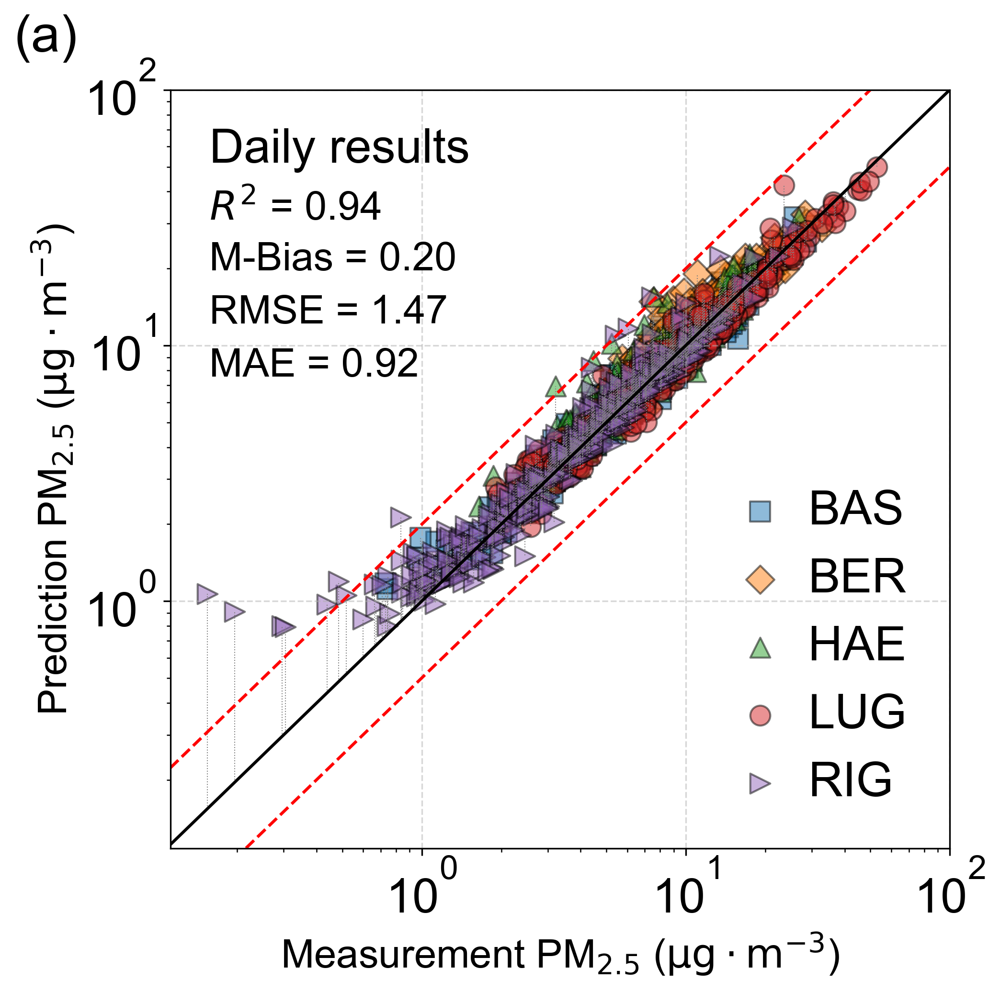

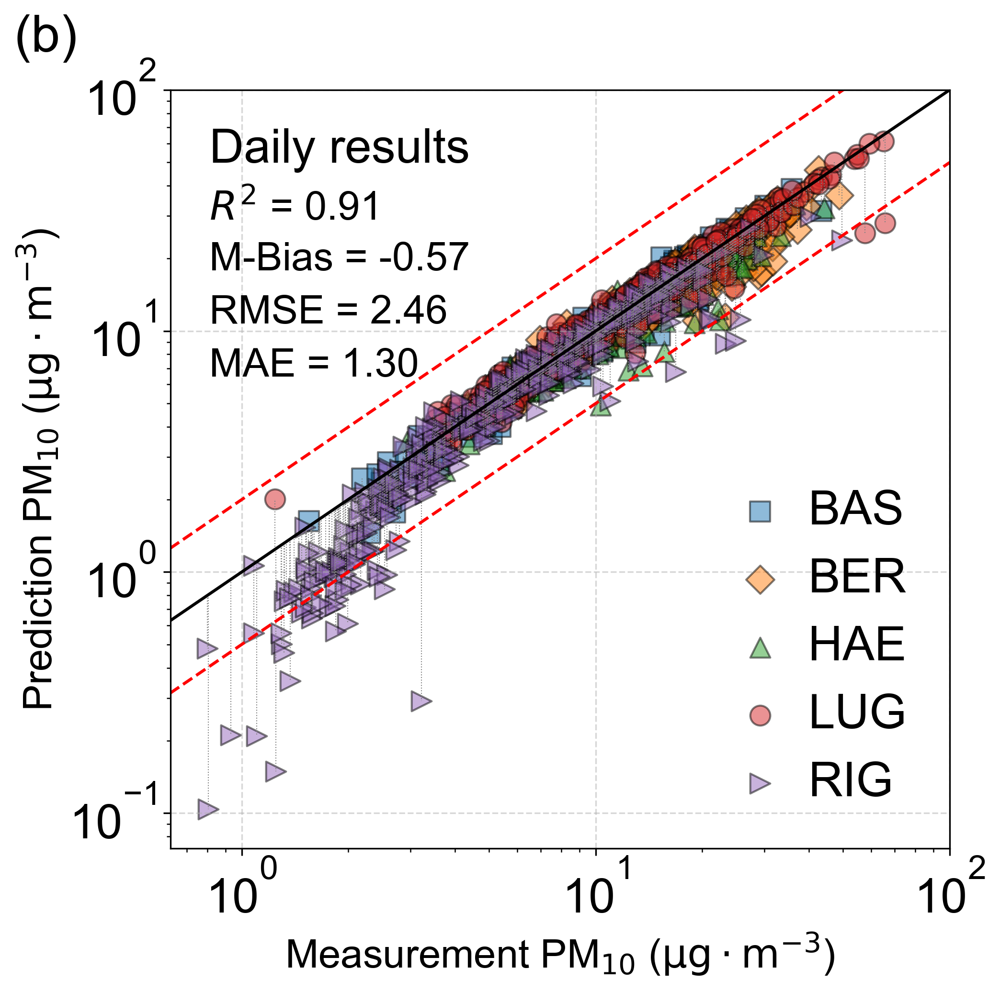

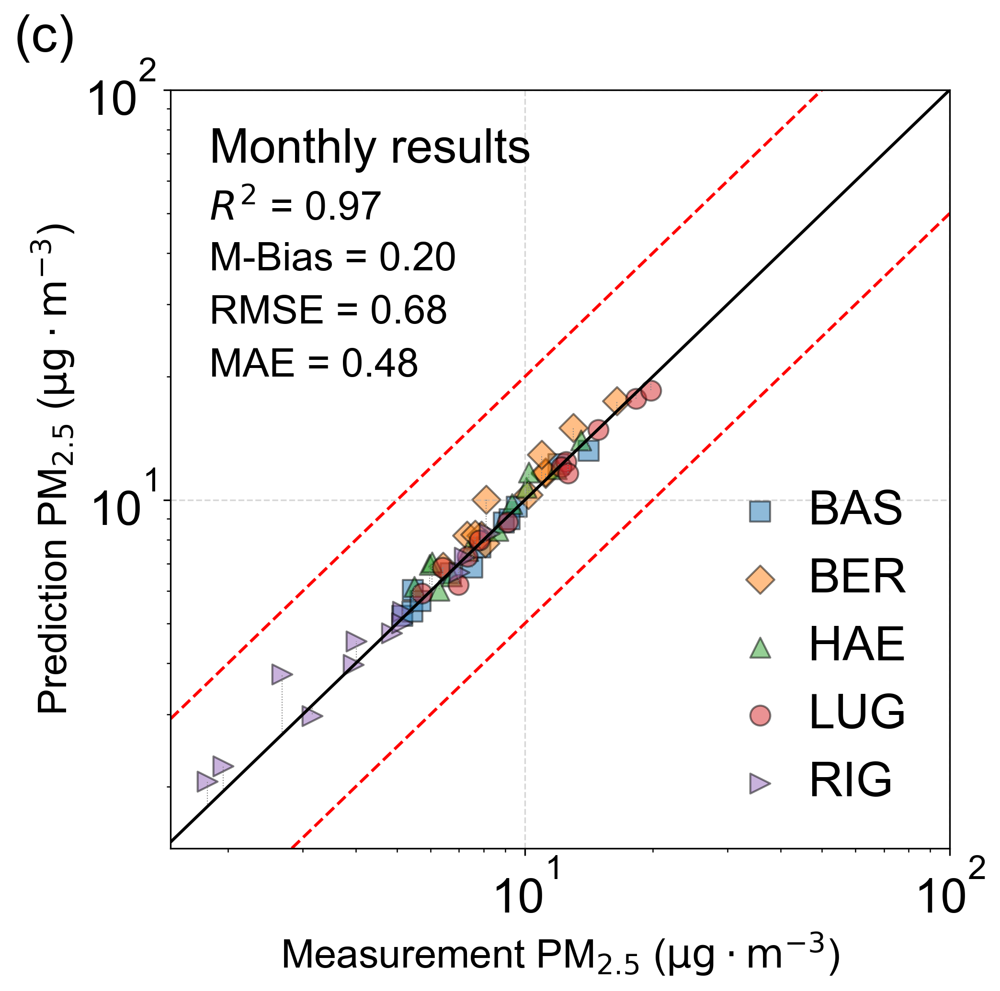

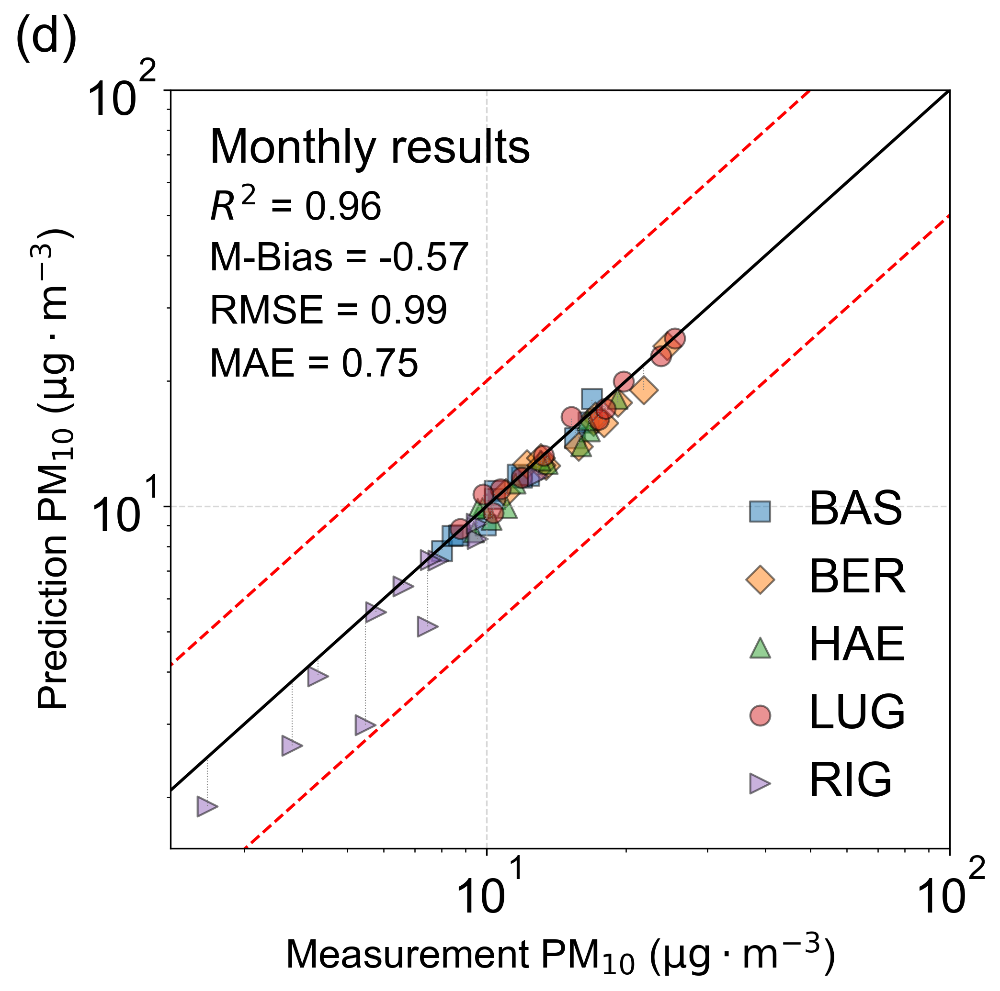

In [44]:
pm_file25 = './out/csv_file/metrics/pncdata2020_pred_test_pm25_stack.csv'
pm_file10 = './out/csv_file/metrics/pncdata2020_pred_test_pm10_stack.csv'
pollution_type10 = 'PM10'
pollution_type25 = 'PM2.5'
log_plot(pm_file25, pollution_type25, time_type='Daily', num_text='(a)')
log_plot(pm_file10, pollution_type10, time_type='Daily', num_text='(b)')
log_plot(pm_file25, pollution_type25, time_type='Monthly', num_text='(c)')
log_plot(pm_file10, pollution_type10, time_type='Monthly', num_text='(d)')

- pop plot

In [1]:
from scipy.io import loadmat

pm25_data = loadmat('./out/mat_file/PMpopmat/PM25_pop_all.mat')
pm10_data = loadmat('./out/mat_file/PMpopmat/PM10_pop_all.mat')
pm25_data.keys(), pm10_data.keys()
pm25_2020 = pm25_data['avgConc_pm25']
pm10_2020 = pm10_data['avgConc_pm10']
pop_bt = pm25_data['pop_bt']
pop_mt = pm25_data['pop_mt']
pop_ft = pm25_data['pop_ft']
pop_0_14 = pm25_data['pop_0_14']
pop_15_64 = pm25_data['pop_15_64']
pop_65 = pm25_data['pop_65']

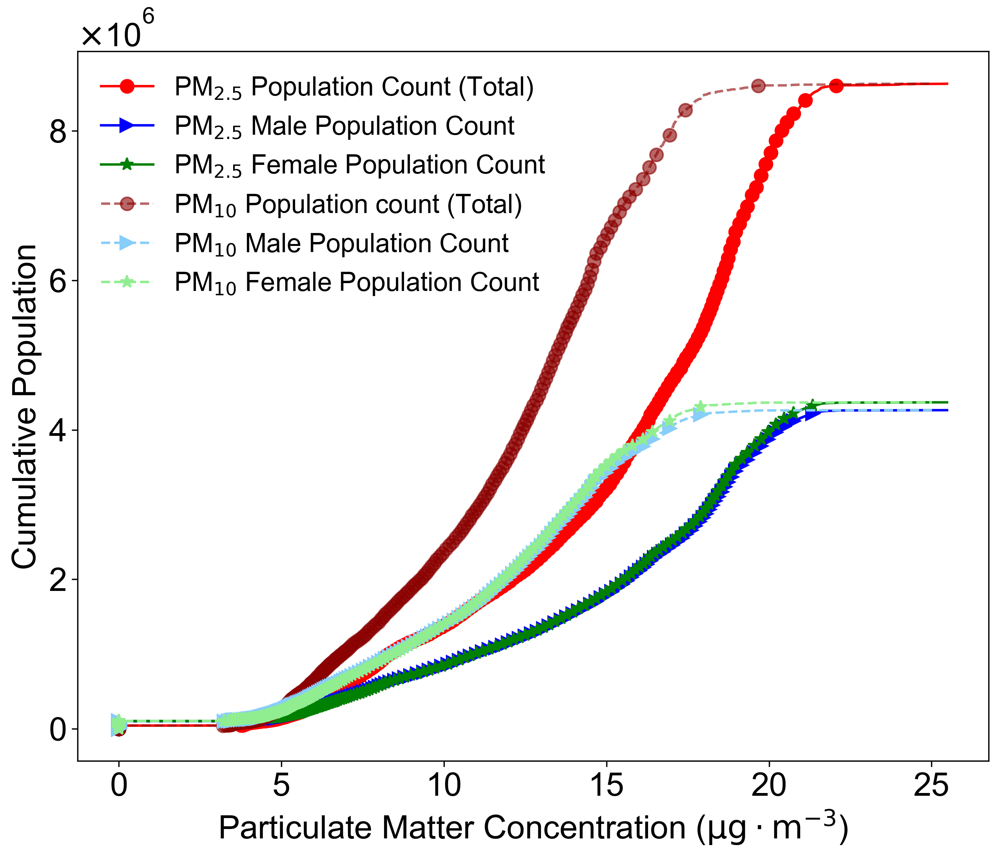

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 20
from matplotlib.ticker import ScalarFormatter


combined_data_gender_25 = np.array([pm25_2020.flatten(), pop_bt.flatten(), pop_mt.flatten(),
                          pop_ft.flatten()]).T
combined_data_gender_10 = np.array([pm10_2020.flatten(), pop_bt.flatten(), pop_mt.flatten(),
                          pop_ft.flatten()]).T
combined_data_age_25 = np.array([pm25_2020.flatten(), pop_bt.flatten(), pop_0_14.flatten(),
                          pop_15_64.flatten(), pop_65.flatten()]).T
combined_data_age_10 = np.array([pm10_2020.flatten(), pop_bt.flatten(), pop_0_14.flatten(),
                            pop_15_64.flatten(), pop_65.flatten()]).T

sorted_data_gender_25 = combined_data_gender_25[combined_data_gender_25[:, 0].argsort()]
sorted_data_gender_10 = combined_data_gender_10[combined_data_gender_10[:, 0].argsort()]
sorted_data_age_25 = combined_data_age_25[combined_data_age_25[:, 0].argsort()]
sorted_data_age_10 = combined_data_age_10[combined_data_age_10[:, 0].argsort()]


cumulative_population_all_25 = np.cumsum(sorted_data_gender_25 [:, 1])
cumulative_population_mt_25 = np.cumsum(sorted_data_gender_25 [:, 2])
cumulative_population_ft_25 = np.cumsum(sorted_data_gender_25 [:, 3])
cumulative_population_all_10 = np.cumsum(sorted_data_gender_10[:, 1])
cumulative_population_mt_10 = np.cumsum(sorted_data_gender_10[:, 2])
cumulative_population_ft_10 = np.cumsum(sorted_data_gender_10[:, 3])

cumulative_population_age_25 = np.cumsum(sorted_data_age_25[:, 1])
cumulative_population_0_14_25 = np.cumsum(sorted_data_age_25[:, 2])
cumulative_population_15_64_25 = np.cumsum(sorted_data_age_25[:, 3])
cumulative_population_65_25 = np.cumsum(sorted_data_age_25[:, 4])
cumulative_population_age_10 = np.cumsum(sorted_data_age_10[:, 1])
cumulative_population_0_14_10 = np.cumsum(sorted_data_age_10[:, 2])
cumulative_population_15_64_10 = np.cumsum(sorted_data_age_10[:, 3])
cumulative_population_65_10 = np.cumsum(sorted_data_age_10[:, 4])


plt.figure(figsize=(10, 8), dpi=300)
plt.plot(sorted_data_gender_25[:, 0], cumulative_population_all_25.flatten(), marker='o', color='r', markersize=8,
         label=r'PM$_{2.5}$ Population Count (Total)', markevery=200)
plt.plot(sorted_data_gender_25[:, 0], cumulative_population_mt_25.flatten(), marker='>', color='b', markersize=8,
         label=r'PM$_{2.5}$ Male Population Count', markevery=300)
plt.plot(sorted_data_gender_25[:, 0], cumulative_population_ft_25.flatten(), marker='*', color='g', markersize=8,
         label=r'PM$_{2.5}$ Female Population Count', markevery=300)
plt.plot(sorted_data_gender_10[:, 0], cumulative_population_all_10.flatten(), marker='o', color='darkred', markersize=8,
         label=r'PM$_{10}$ Population count (Total)', alpha=0.6, markevery=200, linestyle='--')
plt.plot(sorted_data_gender_10[:, 0], cumulative_population_mt_10.flatten(), marker='>', color='lightskyblue', markersize=8,
         label=r'PM$_{10}$ Male Population Count', markevery=300, linestyle='--')
plt.plot(sorted_data_gender_10[:, 0], cumulative_population_ft_10.flatten(), marker='*', color='lightgreen', markersize=8,
         label=r'PM$_{10}$ Female Population Count', markevery=300, linestyle='--')
plt.xlabel(r"Particulate Matter Concentration ($\mathrm{μg \cdot m^{-3}}$)")
plt.ylabel('Cumulative Population')
plt.gca().yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
plt.legend(loc='upper left', ncol=1,
           edgecolor='black', frameon=False, fontsize=16)
# plt.grid(True)
# plt.savefig('./figure/cumulative_population.png', dpi=600, bbox_inches='tight')
plt.show()

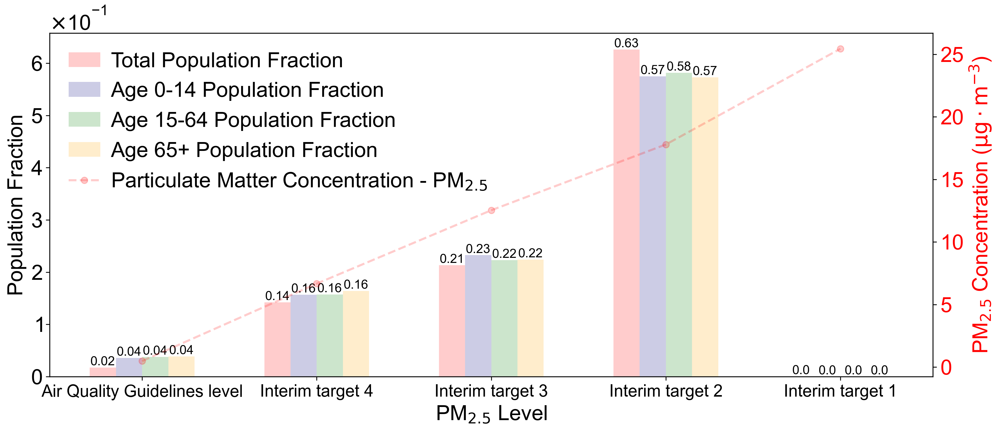

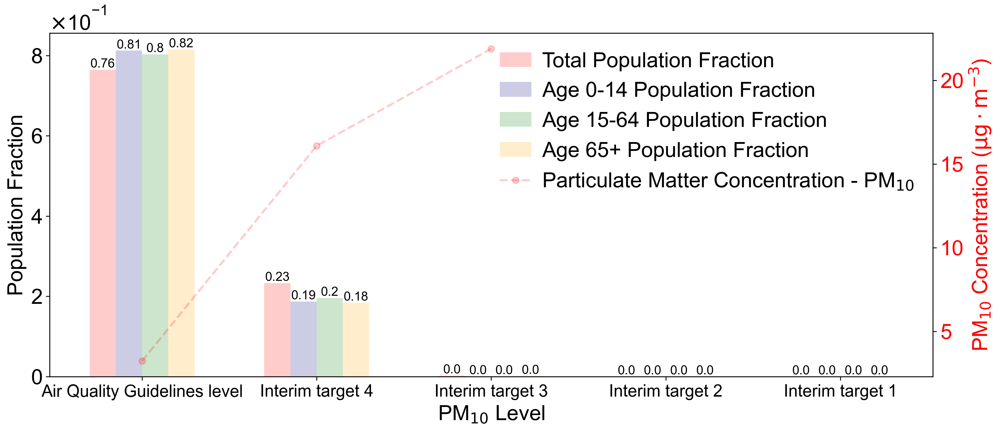

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 20


sorted_data_age_25_df = pd.DataFrame(sorted_data_age_25,
                                     columns=['pm25', 'pop', 'pop_0_14', 'pop_15_64', 'pop_65'])
sorted_data_age_10_df = pd.DataFrame(sorted_data_age_10,
                                     columns=['pm10', 'pop', 'pop_0_14', 'pop_15_64', 'pop_65'])

bins_age_25 = [0, 5, 10, 15, 25, 35]
bins_age_10 = [0, 15, 20, 30, 50, 70]
labels = ['Air Quality Guidelines level', 'Interim target 4', 'Interim target 3',
          'Interim target 2', 'Interim target 1']
sorted_data_age_25_df['pm25_interval'] = pd.cut(sorted_data_age_25_df['pm25'],
                                                bins=bins_age_25, labels=labels, include_lowest=True)
sorted_data_age_10_df['pm10_interval'] = pd.cut(sorted_data_age_10_df['pm10'],
                                                bins=bins_age_10, labels=labels, include_lowest=True)
group_data_age_25 = sorted_data_age_25_df.groupby('pm25_interval', as_index=False).sum()
group_data_age_10 = sorted_data_age_10_df.groupby('pm10_interval', as_index=False).sum()

average_pm25 = sorted_data_age_25_df.groupby('pm25_interval', as_index=False).mean()['pm25']
average_pm10 = sorted_data_age_10_df.groupby('pm10_interval', as_index=False).mean()['pm10']

group_data_age_25['pop'] = group_data_age_25['pop']/np.sum(group_data_age_25['pop'])
group_data_age_10['pop'] = group_data_age_10['pop']/np.sum(group_data_age_10['pop'])
group_data_age_25['pop_0_14'] = group_data_age_25['pop_0_14']/np.sum(group_data_age_25['pop_0_14'])
group_data_age_10['pop_0_14'] = group_data_age_10['pop_0_14']/np.sum(group_data_age_10['pop_0_14'])
group_data_age_25['pop_15_64'] = group_data_age_25['pop_15_64']/np.sum(group_data_age_25['pop_15_64'])
group_data_age_10['pop_15_64'] = group_data_age_10['pop_15_64']/np.sum(group_data_age_10['pop_15_64'])
group_data_age_25['pop_65'] = group_data_age_25['pop_65']/np.sum(group_data_age_25['pop_65'])
group_data_age_10['pop_65'] = group_data_age_10['pop_65']/np.sum(group_data_age_10['pop_65'])
group_data_age_10['pm10'] = average_pm10
group_data_age_25['pm25'] = average_pm25

age_colors = ['red', 'navy', 'green', 'orange']
group_data_columns25 = group_data_age_25.columns[2:]
group_data_columns10 = group_data_age_10.columns[2:]
group_label = ['Total Population Fraction', 'Age 0-14 Population Fraction',
               'Age 15-64 Population Fraction', 'Age 65+ Population Fraction']

fig, ax1 = plt.subplots(figsize=(15, 6), dpi=300)
width = 0.15
group_count = len(group_data_columns25)
offset = (group_count * width) / 2
x = np.arange(len(labels))

for i, column in enumerate(group_data_columns25):
    bars = ax1.bar(x + i*width - offset + width/2, group_data_age_25[column], width,
                   label=group_label[i], color=age_colors[i], alpha=0.2)
    for bar in bars:
        yval = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom',
                 fontdict={'fontsize': 12})

ax1.set_xticks(x)
ax1.set_xticklabels(labels, fontsize=16)
ax1.set_xlabel(r'PM$_{2.5}$ Level')
ax1.set_ylabel('Population Fraction')
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax2 = ax1.twinx()
ax2.plot(labels, group_data_age_25['pm25'], color='red', marker='o', linestyle='--',
         linewidth=2, alpha=0.2, label=r'Particulate Matter Concentration - PM$_{2.5}$')
ax2.set_ylabel(r'PM$_{2.5}$ Concentration ($\mathrm{μg \cdot m^{-3}}$)',
               color='red', fontdict={'fontsize': 20})
ax2.tick_params(axis='y', labelcolor='red')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
plt.legend(lines1+lines2, labels1+labels2, loc='upper left',
           frameon=False, handlelength=1.5, handletextpad=0.5)
# plt.savefig('./figure/hist_pm25.png', dpi=600, bbox_inches='tight')
plt.show()

fig, ax1 = plt.subplots(figsize=(15, 6), dpi=300)
width = 0.15
group_count = len(group_data_columns10)
offset = (group_count * width) / 2
x = np.arange(len(labels))

for i, column in enumerate(group_data_columns10):
    bars = ax1.bar(x + i*width - offset + width/2, group_data_age_10[column], width,
                   label=group_label[i], color=age_colors[i], alpha=0.2)
    for bar in bars:
        yval = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom',
                 fontdict={'fontsize': 12})

ax1.set_xticks(x)
ax1.set_xticklabels(labels, fontsize=16)
ax1.set_xlabel(r'PM$_{10}$ Level')
ax1.set_ylabel('Population Fraction')
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax2 = ax1.twinx()
ax2.plot(labels, group_data_age_10['pm10'], color='red', marker='o', linestyle='--',
         linewidth=2, alpha=0.2, label=r'Particulate Matter Concentration - PM$_{10}$')
ax2.set_ylabel(r'PM$_{10}$ Concentration ($\mathrm{μg \cdot m^{-3}}$)',
               color='red', fontdict={'fontsize': 20})
ax2.tick_params(axis='y', labelcolor='red')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
plt.legend(lines1+lines2, labels1+labels2, loc='upper right',
           frameon=False, handlelength=1.5, handletextpad=0.5)
# plt.savefig('./figure/hist_pm10.png', dpi=600, bbox_inches='tight')
plt.show()

25.47695224726057 0.0


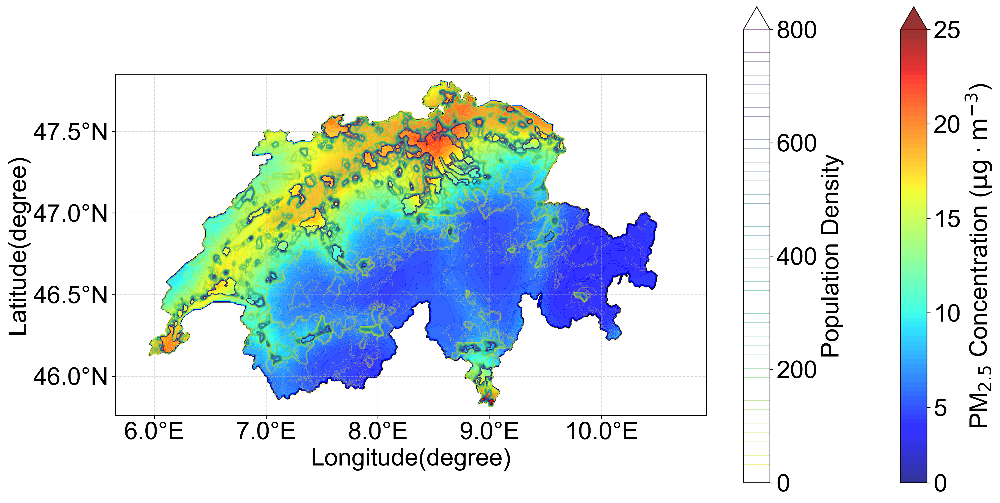

In [17]:
import numpy as np
from scipy.io import savemat, loadmat
from scipy import interpolate
import geopandas as gpd
from matplotlib.path import Path
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib
matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 26

pmmat_data = loadmat('./out/mat_file/PMpopmat/PM25_pop_all.mat')
matlon = pmmat_data['matlon'][0][:]
matlat = pmmat_data['matlat'][0][:]
avgPM = pmmat_data['avgConc_pm25']
inter_pop = pmmat_data['pop_bt']

new_matlon = np.linspace(matlon.min(), matlon.max(), 531)
new_matlat = np.linspace(matlat.min(), matlat.max(), 211)
new_matlat = new_matlat[::-1]

switzerland = gpd.read_file('../code/pncEstimator-main/data/geoshp/gadm36_CHE_0.shp')
switzerland_polygon = switzerland.unary_union
paths = []
if switzerland_polygon.geom_type == 'MultiPolygon':
    for polygon in switzerland_polygon.geoms:
        paths.append(Path(np.array(polygon.exterior.coords)))
else:
    paths.append(Path(np.array(switzerland_polygon.exterior.coords)))

mat_lon_grid, mat_lat_grid = np.meshgrid(new_matlon, new_matlat)
lon_lat_points = np.vstack((mat_lon_grid.flatten(), mat_lat_grid.flatten())).T
inside_swiss_mask = np.zeros(len(lon_lat_points), dtype=bool)
for path in paths:
    inside_swiss_mask |= path.contains_points(lon_lat_points)
inside_swiss_mask = inside_swiss_mask.reshape(avgPM.shape)
inside_swiss_PM = np.where(inside_swiss_mask, avgPM, 0)
print(np.max(inside_swiss_PM), np.min(inside_swiss_PM))

plt.figure(figsize=(16, 8), dpi=300)
switzerland.plot(ax=plt.gca(), color='none', edgecolor='k', linewidth=2)
avg_levels = np.linspace(1, 25, 100)
cp = plt.contourf(mat_lon_grid, mat_lat_grid, inside_swiss_PM,
                  cmap='jet', alpha=0.8, extend='max',
                  levels=avg_levels)
cbar = plt.colorbar(cp, label=r"PM$_{2.5}$ Concentration ($\mathrm{μg \cdot m^{-3}}$)",
                    extend='max', aspect=18)
cbar.locator = ticker.MaxNLocator((5))
cbar.update_ticks()

levels = np.linspace(0, 800, 100)
elevation_contour = plt.contour(mat_lon_grid, mat_lat_grid, inter_pop, levels=levels, cmap='viridis_r',
                                linewidths=0.2, extend='max', alpha=0.6)
cbar_pop = plt.colorbar(elevation_contour, label='Population Density', extend='max', aspect=18)
cbar_pop.locator = ticker.MaxNLocator((4))
cbar_pop.update_ticks()

ax = plt.gca()
x_ticks = ax.get_xticks()
new_x_ticks = [f'{x:.1f}°E' for x in x_ticks]
ax.set_xticklabels(new_x_ticks)
y_ticks = ax.get_yticks()
new_y_ticks = [f'{y:.1f}°N' for y in y_ticks]
ax.set_yticklabels(new_y_ticks)

plt.xlabel('Longitude(degree)')
plt.ylabel('Latitude(degree)')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)
plt.savefig('./figure/swiss_pm25_pop.png', dpi=600, bbox_inches='tight')
plt.show()

In [5]:
import numpy as np
import PM_pop as pop

weighted_data_all = pop.save_annual_tiff()
weighted_data_all['weighted_pop_pm25'] = weighted_data_all['pm25_pop_sum']/weighted_data_all['pop_bt_sum']
weighted_data_all['weighted_pop_pm10'] = weighted_data_all['pm10_pop_sum']/weighted_data_all['pop_bt_sum']
weighted_data_all['high_annual_pm25'] = np.where(weighted_data_all['weighted_pop_pm25'] >= 5, 1, 0)
weighted_data_all['high_annual_pm10'] = np.where(weighted_data_all['weighted_pop_pm10'] >= 15, 1, 0)
weighted_data_all['day_pm25_mean'] = np.ceil(weighted_data_all['day_pm25_mean'])
weighted_data_all['day_pm10_mean'] = np.ceil(weighted_data_all['day_pm10_mean'])
weighted_data_all

,District,pm25_2020_mean,pm25_2020_sum,pm10_2020_mean,pm10_2020_sum,pm25_pop_mean,pm25_pop_sum,pm10_pop_mean,pm10_pop_sum,day_pm25_mean,...,pop_bt_0_14_mean,pop_bt_0_14_sum,pop_bt_15_64_mean,pop_bt_15_64_sum,pop_bt_65_mean,pop_bt_65_sum,weighted_pop_pm25,weighted_pop_pm10,high_annual_pm25,high_annual_pm10
0,Aarau,18.612745,372.254896,14.575923,291.518463,15196.688006,303933.760111,11978.009113,239560.182257,109.0,...,703.853059,1301.967032,3315.272781,6205.894881,872.247017,1621.744021,18.552135,14.622768,1,0
1,Biberstein,18.883338,226.600052,13.918092,167.017098,3872.428625,46469.143496,2835.752910,34029.034920,112.0,...,302.850642,336.122615,1344.153714,1509.681503,320.679532,357.738189,18.845093,13.800132,1,0
2,Buchs,21.114159,316.712380,16.756663,251.349947,13797.670746,206965.061190,11094.496257,166417.443848,125.0,...,570.431546,791.375832,2477.117647,3477.707433,452.738246,631.322488,21.194740,17.042367,1,1
3,Densbüren,18.770300,488.027809,14.228541,369.942064,2024.528126,52637.731284,1534.616637,39900.032564,107.0,...,321.339487,772.725836,1312.352134,3193.587950,260.260472,629.063343,18.765097,14.224169,1,0
4,Erlinsbach,18.570892,408.559623,14.610045,321.420995,4463.926306,98206.378742,3539.091053,77860.003161,109.0,...,274.755735,559.058732,1191.452396,2453.321853,301.489801,616.606534,18.553637,14.709699,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2681,Weinegg,19.606630,176.459667,17.114457,154.030113,74723.293445,672509.641003,65171.422790,586542.805108,123.0,...,4588.054586,3819.082804,25814.008674,21744.684584,6103.035802,5106.240242,19.618931,17.111045,1,1
2682,Werd,20.785667,41.571333,16.821367,33.642734,80871.644580,161743.289159,65447.581499,130895.162998,132.0,...,4603.301551,851.505407,25380.494571,4751.002157,5973.509372,1110.637574,20.785667,16.821367,1,1
2683,Wipkingen,21.027448,189.247034,17.568503,158.116525,81776.334579,735987.011212,68324.086353,614916.777181,129.0,...,3455.297212,2876.178981,18633.291490,15695.936703,4325.869047,3619.334267,21.027456,17.568429,1,1
2684,Witikon,19.317003,270.438047,16.222396,227.113550,66630.289885,932824.058386,56086.708767,785213.922735,118.0,...,4178.950453,5411.071177,22829.629158,29914.520362,5383.684679,7006.812047,19.340661,16.280194,1,1


In [6]:
data_diff = weighted_data_all[['District', 'weighted_pop_pm25', 'pm25_2020_mean', 'weighted_pop_pm10', 'pm10_2020_mean']]
data_diff['diff_pm25'] = data_diff['weighted_pop_pm25'] - data_diff['pm25_2020_mean']
data_diff['diff_pm10'] = data_diff['weighted_pop_pm10'] - data_diff['pm10_2020_mean']
data_diff['diff_pm25'] = data_diff['diff_pm25'].apply(lambda x: round(x, 2))
data_diff['diff_pm10'] = data_diff['diff_pm10'].apply(lambda x: round(x, 2))
print('pm2.5')
print(np.sum(np.equal(data_diff['diff_pm25'], 0)))
print(np.sum(np.equal(data_diff['diff_pm25'], 0))/2686)
print(len(data_diff[data_diff['diff_pm25'] > 0]['diff_pm25']))
print(len(data_diff[data_diff['diff_pm25'] > 0]['diff_pm25'])/2686)
print(len(data_diff[data_diff['diff_pm25'] < 0]['diff_pm25']))
print(len(data_diff[data_diff['diff_pm25'] < 0]['diff_pm25'])/2686)
print(np.max(data_diff['diff_pm25']), np.min(data_diff['diff_pm25']))
print('------------------------------------')
print('pm10')
print(np.sum(np.equal(data_diff['diff_pm10'], 0)))
print(np.sum(np.equal(data_diff['diff_pm10'], 0))/2686)
print(len(data_diff[data_diff['diff_pm10'] > 0]['diff_pm10']))
print(len(data_diff[data_diff['diff_pm10'] > 0]['diff_pm10'])/2686)
print(len(data_diff[data_diff['diff_pm10'] < 0]['diff_pm10']))
print(len(data_diff[data_diff['diff_pm10'] < 0]['diff_pm10'])/2686)
print(np.max(data_diff['diff_pm10']), np.min(data_diff['diff_pm10']))


pm2.5
269
0.10014892032762472
1613
0.6005212211466865
803
0.29895755770662696
12.59 -1.82
------------------------------------
pm10
200
0.07446016381236038
1845
0.6868950111690245
640
0.23827252419955325
9.48 -1.42


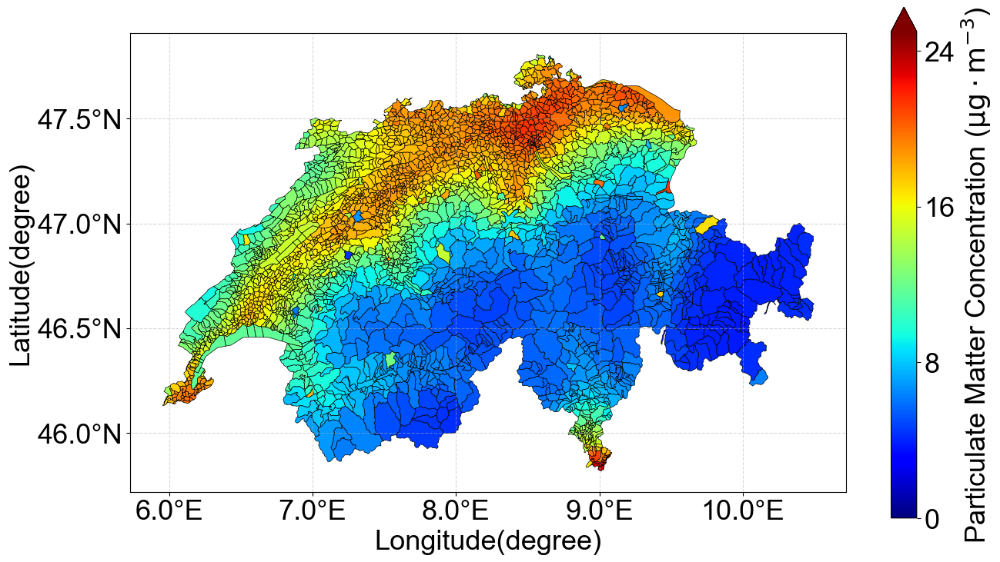

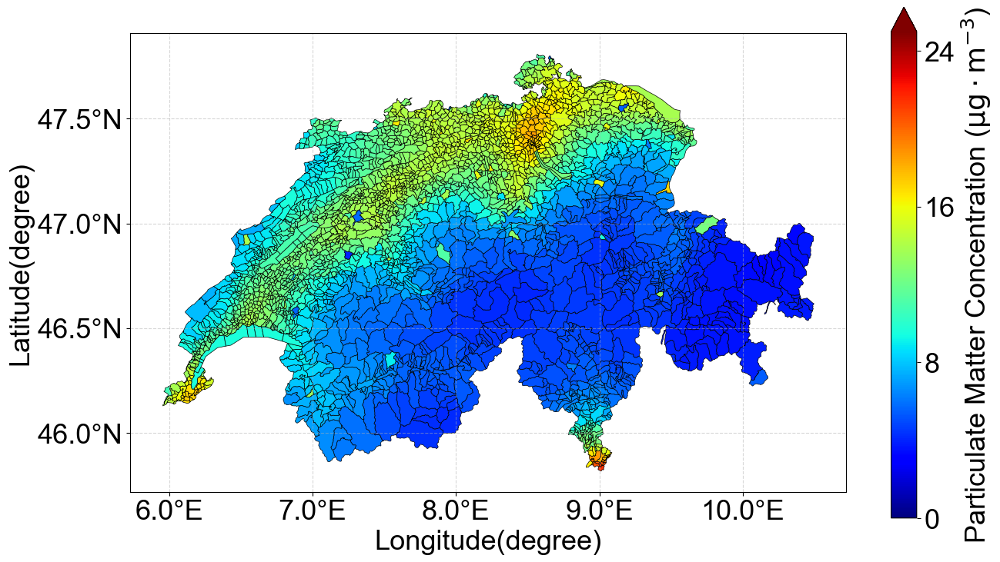

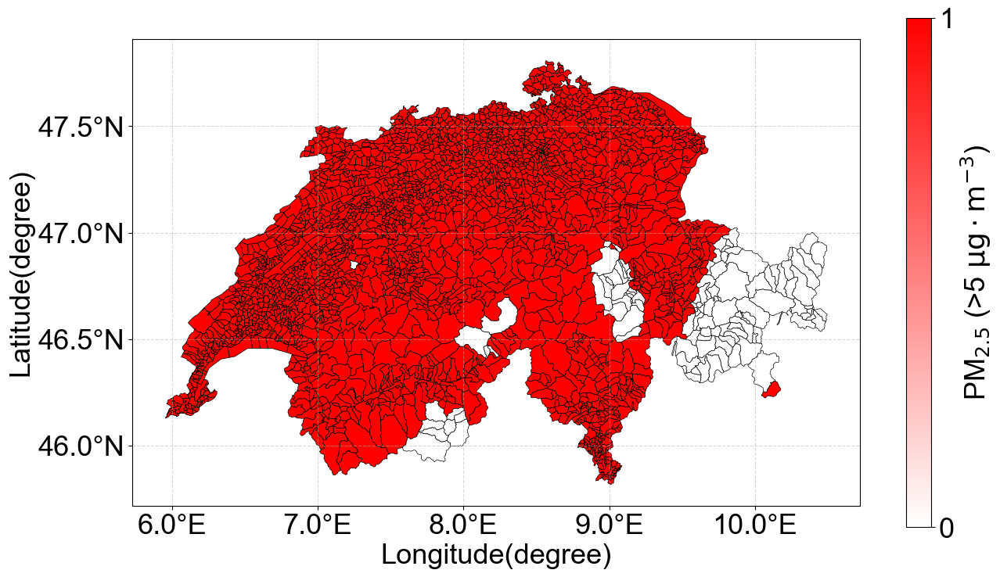

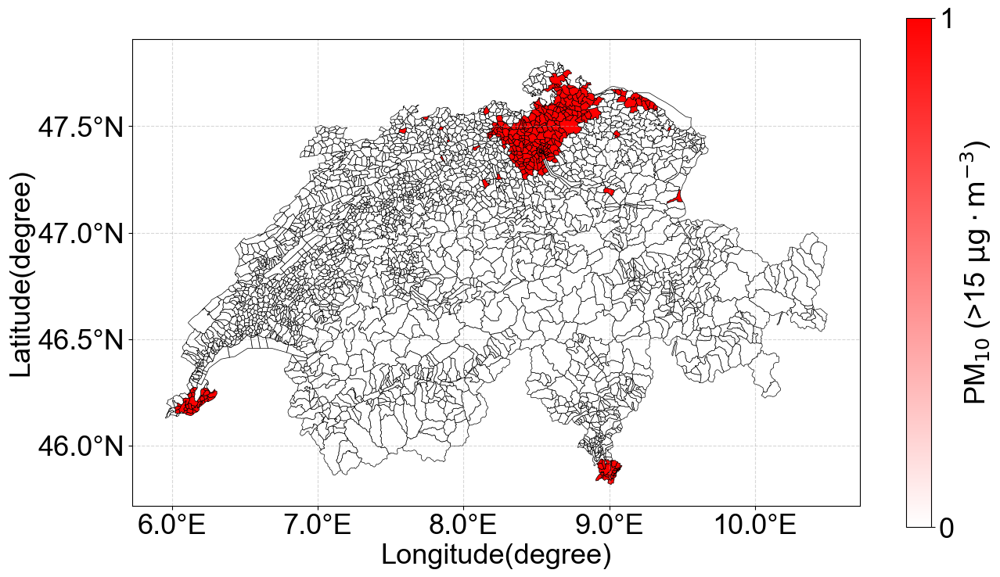

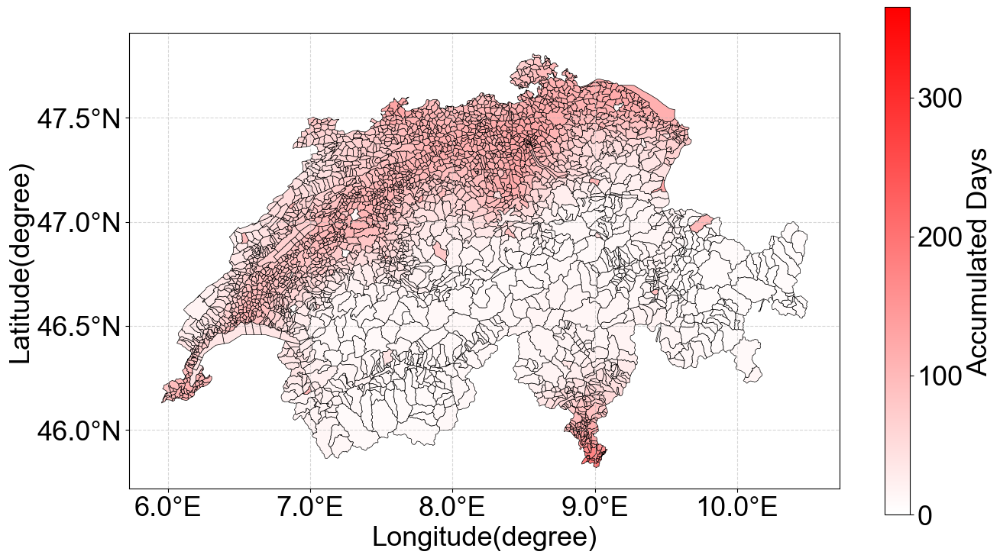

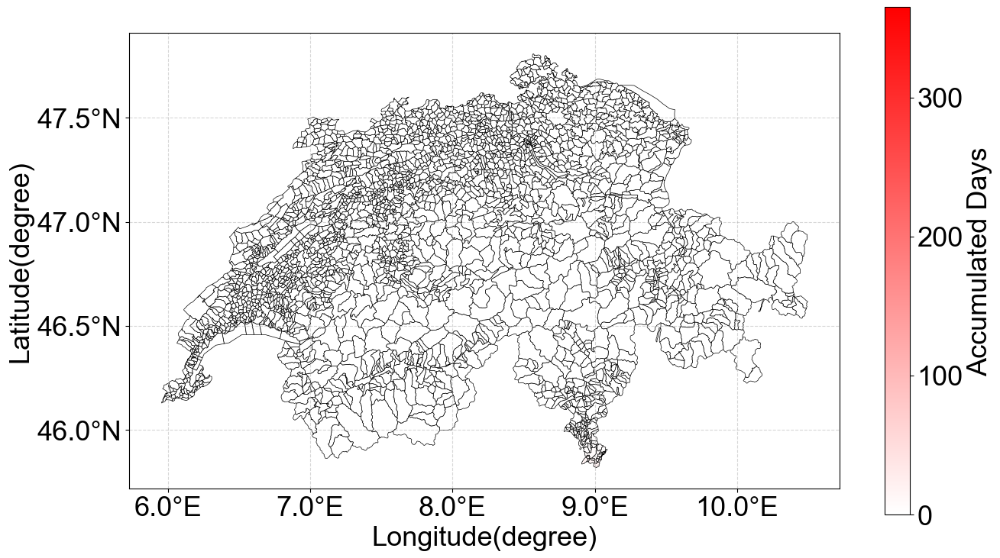

In [15]:
import geopandas as gpd
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, MaxNLocator
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 26
import numpy as np

gdf = gpd.read_file('../code/pncEstimator-main/data/geoshp/gadm36_CHE_3.shp')
data_plot = weighted_data_all.copy()
data_plot.rename(columns={'District': 'NAME_3'}, inplace=True)
gdf = gdf.merge(data_plot, on='NAME_3', how='inner')

cmap_dict_high = {'blue':   [(0.0,  1.0, 1.0),
                        (1.0,  0.0, 0.0)],
             'green': [(0.0,  1.0, 1.0),
                        (1.0,  0.0, 0.0)],
             'red':   [(0.0,  1.0, 1.0),
                        (1.0,  1.0, 1.0)]}
cmap_high = LinearSegmentedColormap('CustomMap', cmap_dict_high)

plot_cols = ['weighted_pop_pm25', 'weighted_pop_pm10',
             'high_annual_pm25', 'high_annual_pm10',
             'day_pm25_mean', 'day_pm10_mean']
figure_num = len(plot_cols)
plot_min_max = [(0, 25), (0, 25),
                (0, 1), (0, 1), (0, 365), (0, 365)]
plot_label = [r"Particulate Matter Concentration ($\mathrm{μg \cdot m^{-3}}$)",
              r"Particulate Matter Concentration ($\mathrm{μg \cdot m^{-3}}$)",
              r'PM$_{2.5}$ (>5 $\mathrm{μg \cdot m^{-3}}$)', r'PM$_{10}$ (>15 $\mathrm{μg \cdot m^{-3}}$)',
              'Accumulated Days', 'Accumulated Days']
plot_camp = ['jet', 'jet', cmap_high, cmap_high, cmap_high, cmap_high]
plot_extend = ['max', 'max', 'neither', 'neither', 'neither', 'neither']
# title_list = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

for i in range(figure_num):
    fig, ax = plt.subplots(1, 1, figsize=(14, 8), dpi=100)
    gdf.plot(column=plot_cols[i], ax=ax, legend=False,
             cmap=plot_camp[i], edgecolor='k', linewidth=0.5,
             vmin=plot_min_max[i][0], vmax=plot_min_max[i][1])
    sm = plt.cm.ScalarMappable(cmap=plot_camp[i],
                               norm=plt.Normalize(vmin=plot_min_max[i][0], vmax=plot_min_max[i][1]))
    sm._A = []
    cbar = fig.colorbar(sm, ax=ax, extend = plot_extend[i],
                        label=plot_label[i])
    cbar.locator = MaxNLocator(integer=True, nbins=4)
    # cbar.locator = FixedLocator(plot_min_max[i])
    cbar.update_ticks()
    ax.set_axis_on()
    ax.set_xlabel('Longitude(degree)')
    ax.set_ylabel('Latitude(degree)')
    x_ticks = ax.get_xticks()
    new_x_ticks = [f'{x:.1f}°E' for x in x_ticks]
    ax.xaxis.set_major_locator(FixedLocator(x_ticks))
    ax.set_xticklabels(new_x_ticks)
    y_ticks = ax.get_yticks()
    new_y_ticks = [f'{y:.1f}°N' for y in y_ticks]
    ax.yaxis.set_major_locator(FixedLocator(y_ticks))
    ax.set_yticklabels(new_y_ticks)
    ax.xaxis.set_major_locator(plt.MaxNLocator(5))
    ax.yaxis.set_major_locator(plt.MaxNLocator(5))
    ax.grid(True, linestyle='--', alpha=0.5)
#     plt.text(x=0.05, y=0.95, s = title_list[i], verticalalignment='top', horizontalalignment='left',
#          fontsize=32, transform=plt.gca().transAxes)
    plt.tight_layout()
    plt.savefig(f'./figure/{plot_cols[i]}.png', dpi=600, bbox_inches='tight')
    plt.show()

In [7]:
import numpy as np
import PM_pop as pop
import pandas as pd

weighted_data_all_land = pop.save_annual_tiff_land()
weighted_data_all_land ['weighted_pop_pm25'] = weighted_data_all_land ['pm25_pop_sum']/weighted_data_all_land ['pop_bt_sum']
weighted_data_all_land ['weighted_pop_pm10'] = weighted_data_all_land ['pm10_pop_sum']/weighted_data_all_land ['pop_bt_sum']
weighted_data_all_land ['high_annual_pm25'] = np.where(weighted_data_all_land ['weighted_pop_pm25'] >= 5, 1, 0)
weighted_data_all_land ['high_annual_pm10'] = np.where(weighted_data_all_land ['weighted_pop_pm10'] >= 15, 1, 0)
weighted_data_all_land ['day_pm25_mean'] = np.ceil(weighted_data_all_land ['day_pm25_mean'])
weighted_data_all_land ['day_pm10_mean'] = np.ceil(weighted_data_all_land ['day_pm10_mean'])
weighted_data_all_land 

,District,pm25_2020_mean,pm25_2020_sum,pm10_2020_mean,pm10_2020_sum,pm25_pop_mean,pm25_pop_sum,pm10_pop_mean,pm10_pop_sum,day_pm25_mean,...,Snow_mean,Snow_sum,PermanentWater_mean,PermanentWater_sum,SeasonalWater_mean,SeasonalWater_sum,weighted_pop_pm25,weighted_pop_pm10,high_annual_pm25,high_annual_pm10
0,Aarau,18.612745,372.254896,14.575923,291.518463,15196.688006,303933.760111,11978.009113,239560.182257,109.0,...,0.0,0.0,0.005562,0.111240,0.016749,0.334972,18.552135,14.622768,1,0
1,Biberstein,18.883338,226.600052,13.918092,167.017098,3872.428625,46469.143496,2835.752910,34029.034920,112.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,18.845093,13.800132,1,0
2,Buchs,21.114159,316.712380,16.756663,251.349947,13797.670746,206965.061190,11094.496257,166417.443848,125.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,21.194740,17.042367,1,1
3,Densbüren,18.770300,488.027809,14.228541,369.942064,2024.528126,52637.731284,1534.616637,39900.032564,107.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,18.765097,14.224169,1,0
4,Erlinsbach,18.570892,408.559623,14.610045,321.420995,4463.926306,98206.378742,3539.091053,77860.003161,109.0,...,0.0,0.0,0.000000,0.000000,0.000046,0.001017,18.553637,14.709699,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2681,Weinegg,19.606630,176.459667,17.114457,154.030113,74723.293445,672509.641003,65171.422790,586542.805108,123.0,...,0.0,0.0,0.004435,0.039917,0.000113,0.001017,19.618931,17.111045,1,1
2682,Werd,20.785667,41.571333,16.821367,33.642734,80871.644580,161743.289159,65447.581499,130895.162998,132.0,...,0.0,0.0,0.000000,0.000000,0.000678,0.001356,20.785667,16.821367,1,1
2683,Wipkingen,21.027448,189.247034,17.568503,158.116525,81776.334579,735987.011212,68324.086353,614916.777181,129.0,...,0.0,0.0,0.001488,0.013388,0.002091,0.018817,21.027456,17.568429,1,1
2684,Witikon,19.317003,270.438047,16.222396,227.113550,66630.289885,932824.058386,56086.708767,785213.922735,118.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,19.340661,16.280194,1,1


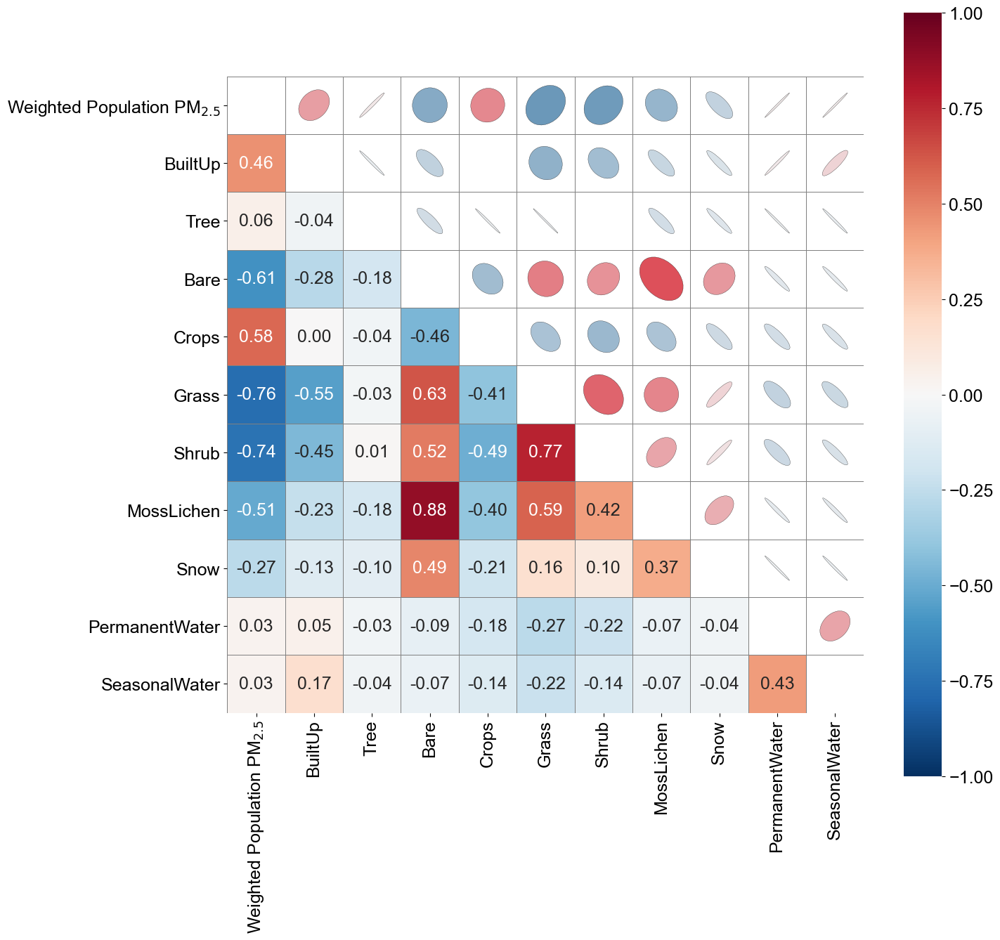

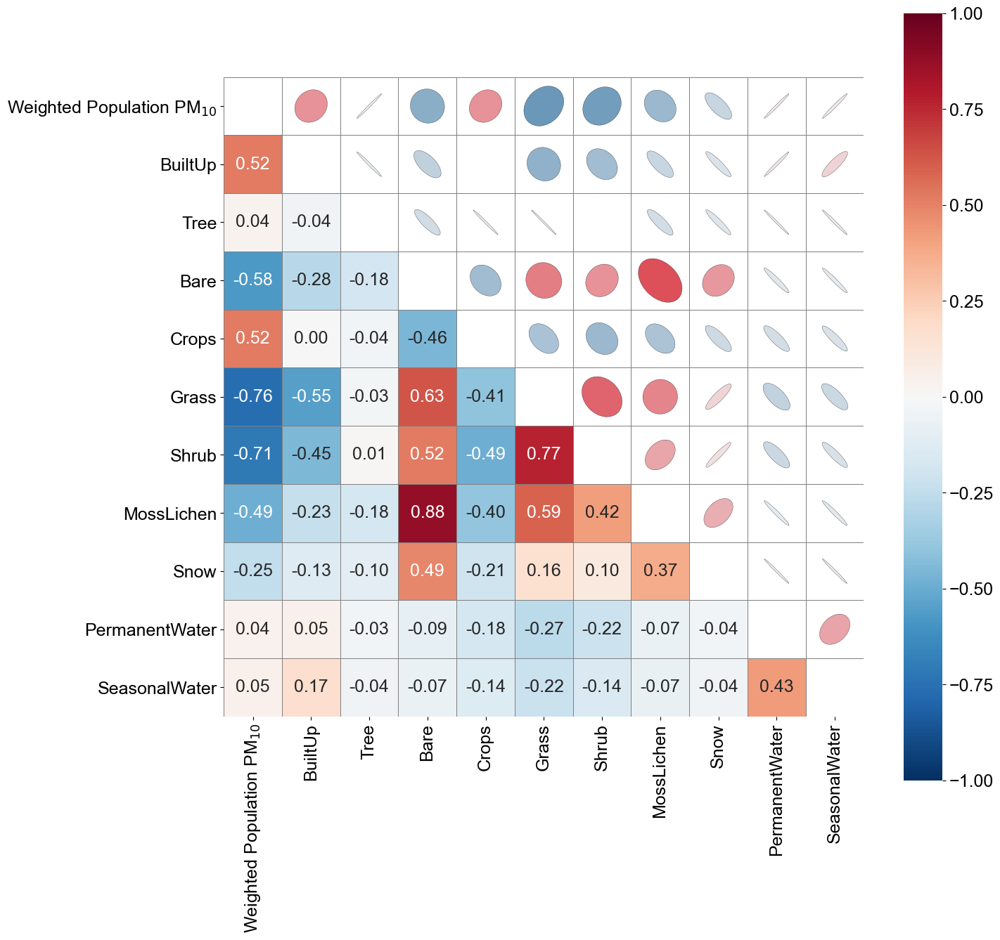

In [8]:
import os
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Ellipse
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 18

land25_df = weighted_data_all_land[['District', 'weighted_pop_pm25', 'BuiltUp_mean',
                                    'Tree_mean', 'Bare_mean', 'Crops_mean', 'Grass_mean',
                                    'Shrub_mean', 'MossLichen_mean', 'Snow_mean',
                                    'PermanentWater_mean', 'SeasonalWater_mean']]
land10_df = weighted_data_all_land[['District', 'weighted_pop_pm10', 'BuiltUp_mean',
                                    'Tree_mean', 'Bare_mean', 'Crops_mean', 'Grass_mean',
                                    'Shrub_mean', 'MossLichen_mean', 'Snow_mean',
                                    'PermanentWater_mean', 'SeasonalWater_mean']]
land25_df_corr = land25_df.corr()
land10_df_corr = land10_df.corr()

threshold = 0.02
cmap = sns.diverging_palette(240, 10, as_cmap=True)
fig, ax = plt.subplots(figsize=(15, 14), dpi=100)
land25_df_name = [r'Weighted Population PM$_{2.5}$', 'BuiltUp', 'Tree', 'Bare', 'Crops',
                  'Grass', 'Shrub', 'MossLichen', 'Snow',
                  'PermanentWater', 'SeasonalWater']
mask = np.triu(np.ones_like(land25_df_corr, dtype=bool))
sns.heatmap(land25_df_corr, mask=mask, annot=True, fmt=".2f", cmap="RdBu_r",
            cbar=True, ax=ax, vmin=-1, vmax=1, square=True, linewidths=.5, linecolor='grey')
xticks = ax.get_xticks()
yticks = ax.get_yticks()
for i in range(len(land25_df_corr)):
    for j in range(i+1, len(land25_df_corr)):
        value = land25_df_corr.iloc[i, j]
        if np.abs(value) > threshold:
            color = cmap(0.5 * (value + 1)) 
            angle = 45 if value > 0 else 135
            ellipse = Ellipse((xticks[j], yticks[i]), width=np.abs(value), height=0.6, angle=angle,
                              facecolor=color, edgecolor='black', lw=0.2)
            ax.add_patch(ellipse)
ax.set_xticks(xticks, minor=False)
ax.set_yticks(yticks, minor=False)
ax.set_xticklabels(land25_df_name)
ax.set_yticklabels(land25_df_name)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('./figure/land25_heatmap.png', dpi=600, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(figsize=(15, 14), dpi=100)
land10_df_name = [r'Weighted Population PM$_{10}$', 'BuiltUp', 'Tree', 'Bare', 'Crops',
                  'Grass', 'Shrub', 'MossLichen', 'Snow',
                  'PermanentWater', 'SeasonalWater']
mask = np.triu(np.ones_like(land10_df_corr, dtype=bool))
sns.heatmap(land10_df_corr, mask=mask, annot=True, fmt=".2f", cmap="RdBu_r",
            cbar=True, ax=ax, vmin=-1, vmax=1, square=True, linewidths=.5, linecolor='grey')
xticks = ax.get_xticks()
yticks = ax.get_yticks()
for i in range(len(land10_df_corr)):
    for j in range(i+1, len(land10_df_corr)):
        value = land10_df_corr.iloc[i, j]
        if np.abs(value) > threshold:
            color = cmap(0.5 * (value + 1)) 
            angle = 45 if value > 0 else 135
            ellipse = Ellipse((xticks[j], yticks[i]), width=np.abs(value), height=0.6, angle=angle,
                              facecolor=color, edgecolor='black', lw=0.2)
            ax.add_patch(ellipse)
ax.set_xticks(xticks, minor=False)
ax.set_yticks(yticks, minor=False)
ax.set_xticklabels(land10_df_name)
ax.set_yticklabels(land10_df_name)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('./figure/land10_heatmap.png', dpi=600, bbox_inches='tight')
plt.show()

In [16]:
from scipy.stats import pearsonr

data25 = land25_df.copy()
data10 = land10_df.copy()
data25 = data25.dropna()
data10 = data10.dropna()

features = ['BuiltUp_mean', 'Tree_mean', 'Bare_mean', 'Crops_mean', 'Grass_mean', 'Shrub_mean', 'MossLichen_mean',
            'Snow_mean', 'PermanentWater_mean', 'SeasonalWater_mean']

for feature in features:
    corr, p_value = pearsonr(data25['weighted_pop_pm25'], data25[feature])
    print(f'PM2.5 and {feature} - Correlation: {corr}, P-value: {p_value}')

for feature in features:
    corr, p_value = pearsonr(data10['weighted_pop_pm10'], data10[feature])
    print(f'PM10 and {feature} - Correlation: {corr}, P-value: {p_value}')


PM2.5 and BuiltUp_mean - Correlation: 0.4571673552300237, P-value: 8.495528644935021e-139
PM2.5 and Tree_mean - Correlation: 0.056109278341558655, P-value: 0.003633401967093122
PM2.5 and Bare_mean - Correlation: -0.6067956957707002, P-value: 7.601420042938853e-270
PM2.5 and Crops_mean - Correlation: 0.5750852091459372, P-value: 3.0050233628654743e-236
PM2.5 and Grass_mean - Correlation: -0.7619639319453134, P-value: 0.0
PM2.5 and Shrub_mean - Correlation: -0.7373448510857648, P-value: 0.0
PM2.5 and MossLichen_mean - Correlation: -0.5078609133314704, P-value: 4.8854554421534485e-176
PM2.5 and Snow_mean - Correlation: -0.26673739118123574, P-value: 5.743172066150119e-45
PM2.5 and PermanentWater_mean - Correlation: 0.03260805198793366, P-value: 0.09115938953404233
PM2.5 and SeasonalWater_mean - Correlation: 0.03207634751096761, P-value: 0.09656225621337029
PM10 and BuiltUp_mean - Correlation: 0.517115101300429, P-value: 1.5351161659016385e-183
PM10 and Tree_mean - Correlation: 0.038086094

Explained variance by principal components: [0.37650898 0.25865692 0.21072123]
                     Principal Component 1  Principal Component 2  \
BuiltUp_mean                     -0.307811              -0.019282   
Tree_mean                         0.020394               0.993415   
Bare_mean                         0.224066              -0.090112   
Crops_mean                       -0.675880              -0.036202   
Grass_mean                        0.498604              -0.050121   
Shrub_mean                        0.383323              -0.011690   
MossLichen_mean                   0.024092              -0.010538   
Snow_mean                         0.038214              -0.022538   
PermanentWater_mean              -0.015142              -0.007410   
SeasonalWater_mean               -0.001978              -0.001311   

                     Principal Component 3  
BuiltUp_mean                      0.676162  
Tree_mean                        -0.028454  
Bare_mean                 

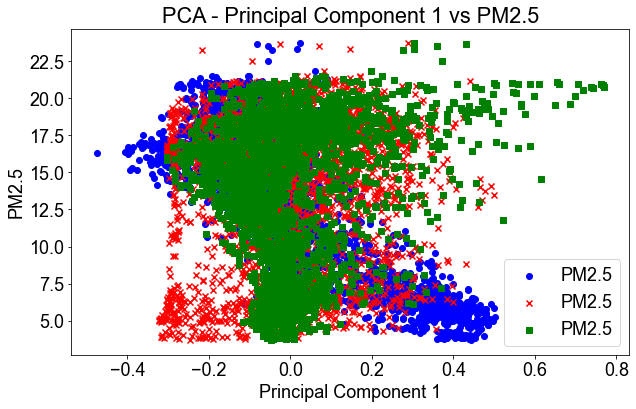

In [10]:
from sklearn.decomposition import PCA

data25 = land25_df.copy()
data10 = land10_df.copy()

features = ['BuiltUp_mean', 'Tree_mean', 'Bare_mean', 'Crops_mean', 'Grass_mean', 'Shrub_mean', 'MossLichen_mean',
            'Snow_mean', 'PermanentWater_mean', 'SeasonalWater_mean']

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(data25[features])

pca_df = pd.DataFrame(data=principalComponents, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'])

pca_df = pd.concat([pca_df, data25[['weighted_pop_pm25']]], axis=1)
explained_variance = pca.explained_variance_ratio_
print('Explained variance by principal components:', explained_variance)
loadings = pd.DataFrame(pca.components_.T, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'], index=features)
print(loadings)

plt.figure(figsize=(10, 6))
plt.scatter(pca_df['Principal Component 1'], pca_df['weighted_pop_pm25'], c='blue', marker='o', label='PM2.5')
plt.scatter(pca_df['Principal Component 2'], pca_df['weighted_pop_pm25'], c='red', marker='x', label='PM2.5')
plt.scatter(pca_df['Principal Component 3'], pca_df['weighted_pop_pm25'], c='green', marker='s', label='PM2.5')
plt.xlabel('Principal Component 1')
plt.ylabel('PM2.5')
plt.legend()
plt.title('PCA - Principal Component 1 vs PM2.5')
plt.show()
